In [22]:
import pathlib
import os
import tarfile

#show Chicago GTFS data
import requests
import shutil
import zipfile

# using pandas to 
import pandas as pd

# Plotting the deployment of AoT nodes in Chicago
import matplotlib.pyplot as plt
import datetime
%matplotlib inline

import numpy as np
import geopandas as gpd
from shapely.geometry import Point

In [23]:
# Read csv data
df = pd.read_csv("./data/Data_Predicted.csv")
df

,Street,Traffic,Latitude,Longitude,Location,Date,Tickets,Permits,Month,Day,Parking Condition
0,Lake St,7100,41.887904,-87.771064,"(41.887904, -87.771064)",11-14,10.952336,1.0,11,14,0
1,76th St,8600,41.756542,-87.617335,"(41.756542, -87.617335)",03-28,36.063781,1.0,3,28,0
2,24th St,700,41.849302,-87.622658,"(41.849302, -87.622658)",03-30,21.336041,14.0,3,30,1
3,Lake St,6900,41.885023,-87.675556,"(41.885023, -87.675556)",10-19,12.127870,1.0,10,19,0
4,71st St,15600,41.764348,-87.704780,"(41.764348, -87.70478)",11-14,41.834436,4.0,11,14,0
...,...,...,...,...,...,...,...,...,...,...,...
363,Homan Ave,2000,41.838150,-87.709739,"(41.83815, -87.709739)",09-14,11.683823,14.0,9,14,1
364,18th St,3800,41.857890,-87.622993,"(41.85789, -87.622993)",04-25,26.117149,10.0,4,25,1
365,Sheffield Ave,10700,41.933448,-87.653886,"(41.933448, -87.653886)",10-04,55.199703,31.0,10,4,0
366,Torrence Ave,15100,41.655545,-87.559298,"(41.655545, -87.559298)",11-08,39.611237,2.0,11,8,0


In [25]:
# https://cybergisxhub.cigi.illinois.edu/wp-content/uploads/2020/01/Urban_Informatics.html#Data
# https://www.hydroshare.org/resource/f184c03de5df442aa5a2ec01fa3252f7/data/contents/shp.zip
Chicago_Streets_Shapefiles = './data/shp/street-chicago.shp'
Chicago_Boundary_Shapefile = './data/shp/il-chicago.shp'

In [36]:
node_locations = pd.DataFrame()
# Pull the longitude and latitude information from the default dataframe
# Use zip to create set of lon, lat tuples then put into a list
node_locations['Coordinates'] = list(zip(df.Longitude.astype(float), df.Latitude.astype(float)))

node_locations['Coordinates'] = node_locations['Coordinates'].apply(Point)

node_locationsDF = gpd.GeoDataFrame(node_locations, geometry='Coordinates')

# create a new column in the default dataframe called status, if the end timestamp is NaN then r is placed in 
# the column otherwise a b is placed in column - this translates to red nodes are active and blue nodes
# are no longer reporting data
df['status'] = np.where(df['Parking Condition']==0, '#FF0000', '#00FF00')

Text(0.5, 1.0, 'Spatial distrinution for Parking Condition in Chicago')

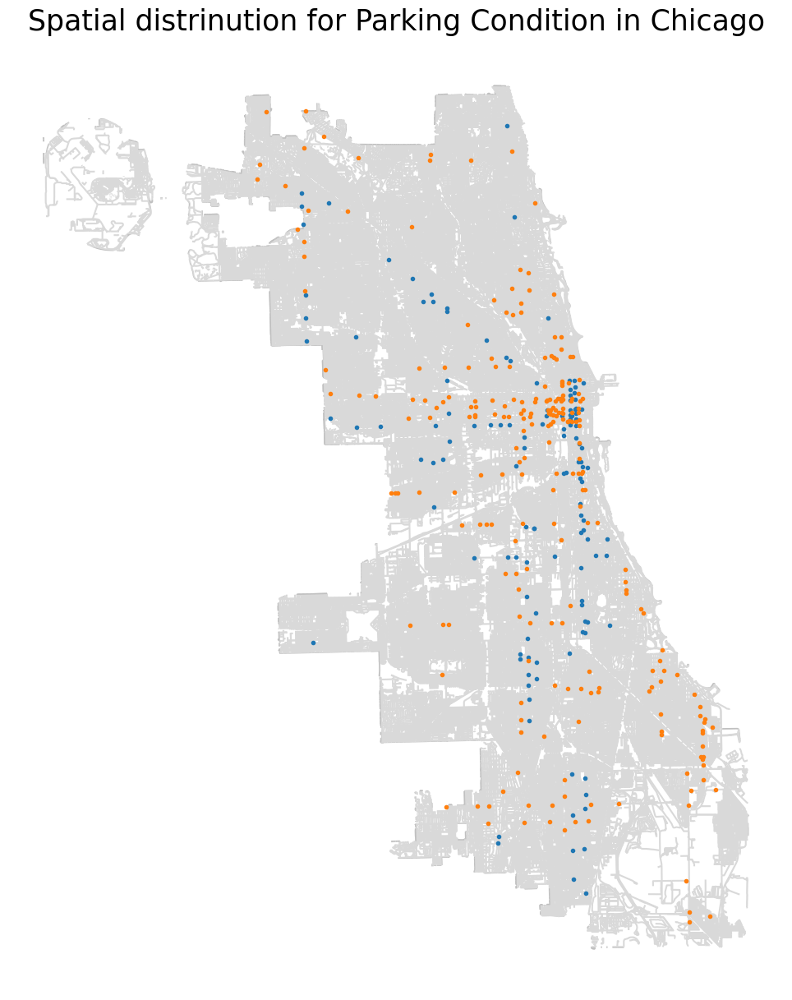

In [40]:
# Plot
plt.style.use('default')

# This reads in a shapefile
streetmap = gpd.read_file(Chicago_Streets_Shapefiles)

f, ax = plt.subplots(1, figsize=(15, 15))

# Plots the Chicago streets
streetmap.plot(ax=ax, color='silver', zorder = 0)

boundary = gpd.read_file(Chicago_Boundary_Shapefile)
# Plots the boundary of Chicago 
#boundary.plot(ax = ax, alpha = 0.1, linewidth = 1.0, edgecolor = 'red', zorder = 5)
boundary.plot(ax=ax, color='white', alpha = 0.4, linewidth=0, edgecolor='r', zorder = 5)

# Plot locations on the map as a new layer - zorder ensures the nodes are on top and
for row_status, row in df.groupby('status'):
    ax.plot(row['Longitude'], row['Latitude'], marker='o', linestyle='', ms=3, label=node_status, zorder = 10)

#ax.legend(['Bad Parking Condition','Good Parking Condition'],fontsize=20)

ax.set_axis_off()
ax.set_title('Spatial distrinution for Parking Condition in Chicago', fontsize = 25, fontdict = {'verticalalignment':'bottom'})



Text(0.5, 1.0, 'Spatial distrinution for Parking Condition in Chicago')

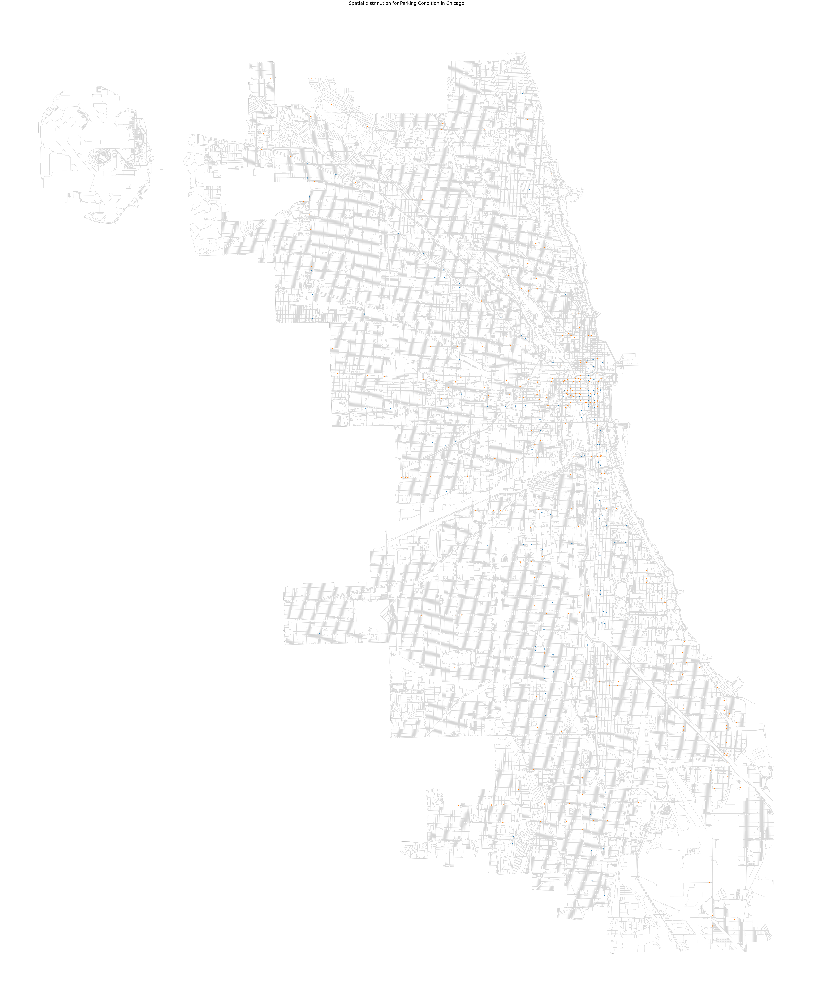

In [38]:
# Plot
plt.style.use('default')

# This reads in a shapefile
streetmap = gpd.read_file(Chicago_Streets_Shapefiles)

f, ax = plt.subplots(1, figsize=(100, 100))

# Plots the Chicago streets
streetmap.plot(ax=ax, color='silver', zorder = 0)

boundary = gpd.read_file(Chicago_Boundary_Shapefile)
# Plots the boundary of Chicago 
#boundary.plot(ax = ax, alpha = 0.1, linewidth = 1.0, edgecolor = 'red', zorder = 5)
boundary.plot(ax=ax, color='white', alpha = 0.4, linewidth=0, edgecolor='r', zorder = 5)

# Plot locations on the map as a new layer - zorder ensures the nodes are on top and
for row_status, row in df.groupby('status'):
    ax.plot(row['Longitude'], row['Latitude'], marker='o', linestyle='', ms=5, label=node_status, zorder = 10)

#ax.legend(['Bad Parking Condition','Good Parking Condition'],fontsize=20)

ax.set_axis_off()
ax.set_title('Spatial distrinution for Parking Condition in Chicago', fontsize = 25, fontdict = {'verticalalignment':'bottom'})

